# Analyzing my Spotify listening history 🎵 - Part 3
> In part 3 of this adventure we discover the audio features that Spotify attributes to songs. We see how they are influenced by specific genres and how some songs relate to different audio features like instrumentalness and energy.

- toc: true
- hide: true
- branch: master
- badges: true
- comments: true
- image: images/spotify_analysis/energy-distribution-rap.png
- author: Bauke Brenninkmeijer
- categories: [Analysis, Music, BI]


In [25]:
#hide
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [26]:
#hide 
import ast
import pandas as pd
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from tqdm.auto import tqdm
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json_lines
import altair as alt
%matplotlib inline

In [27]:
#hide
MAXWIDTH = 640
alt.themes.enable('urbaninstitute')

ThemeRegistry.enable('urbaninstitute')

# Loading previous data ⌛

Let's load up the track IDs and put them in a list, for easier access. 

In [29]:
#collapse-show
def get_track_info():
    lines = []
    for i in json_lines.reader(open('data/EndSong.json', encoding='utf-8')):
        lines.append(i)
    df = pd.DataFrame(lines)
    df = df.drop(['username', 'user_agent_decrypted', 'incognito_mode', 'platform', 
                  'ip_addr_decrypted', 'region', 'longitude', 'latitude', 'city'], axis=1)
    df.ts = pd.to_datetime(df.ts)
    return df

track_info = get_track_info()
track_ids = pd.read_csv('track_ids.csv')
track_ids = track_ids.values.reshape(-1).tolist()
top_1_genres = pd.read_csv('top_1_genres.csv')
top_1_genres_filtered = pd.read_csv('top_1_genres_filtered.csv')

# Audio Features 🎛️

### Using the Spotify API to get audio features

We need to retrieve the audio features for our songs. For this, we use the song IDs we retrieved in part 1. Lets first define our spotify API credentials again, an initialize the library we use to interact, [Spotipy](https://spotipy.readthedocs.io/en/2.13.0/). 

In [28]:
#collapse-hide
SPOTIFY_API_KEY = os.getenv('SPOTIFY_API_KEY')
SPOTIFY_CLIENT_ID = os.getenv('SPOTIFY_CLIENT_ID')
spotify_search_url = 'https://api.spotify.com/v1/search?q={q}&type={type}'
spotify_headers = {"Accept": "application/json", "Authorization":"Bearer " + SPOTIFY_API_KEY, "Content-Type": "application/json"}
client_credentials_manager = SpotifyClientCredentials(SPOTIFY_CLIENT_ID, SPOTIFY_API_KEY)
spotify = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

In [31]:
#hide
spotify.audio_analysis(track_ids[0]).keys()

dict_keys(['meta', 'track', 'bars', 'beats', 'sections', 'segments', 'tatums'])

We can utilize the `.audio_features` call ([docs](https://developer.spotify.com/web-api/get-audio-features/)) to retrieve a lot of information about a track. We give this call a Spotify track URI, so Spotify knows exactly which track the request is about. However, some songs did not give us an URI when we were getting those. So the resulting track IDs have some `None` in them. 

Lets see what the audio features are of _Blue_ from Gemini.

```python
{
    'danceability': 0.455,
    'energy': 0.897,
    'key': 9,
    'loudness': -4.879,
    'mode': 1,
    'speechiness': 0.0403,
    'acousticness': 0.0183,
    'instrumentalness': 0,
    'liveness': 0.174,
    'valence': 0.728,
    'tempo': 160.139,
    'type': 'audio_features',
    'id': '2oPCR02nduYVpj7CTfsA0d',
    'uri': 'spotify:track:2oPCR02nduYVpj7CTfsA0d',
    'track_href': 'https://api.spotify.com/v1/tracks/2oPCR02nduYVpj7CTfsA0d',
    'analysis_url': 'https://api.spotify.com/v1/audio-analysis/2oPCR02nduYVpj7CTfsA0d',
    'duration_ms': 212067,
    'time_signature': 4
}
```

It's important to know what these features actually represent. You can find the full list on the [Spotify website](https://developer.spotify.com/documentation/web-api/reference/tracks/get-audio-features/). I've included the relevant description in the sections below for each audio features that we will discuss. 

In [32]:
#hide
_ = """| Key | Value Type | Value Description |
|-|-|-|
| duration_ms | int | The duration of the track in milliseconds. |
| key | int | The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1. |
| mode | int | Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0. |
| time_signature | int | An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). |
| acousticness | float | A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.|
| danceability | float | Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable. |
| energy | float | Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy. |
| instrumentalness | float | Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0. |
| liveness | float | Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live. |
| loudness | float | The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db. |
| speechiness | float | Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks. |
| valence | float | A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry). |
| tempo | float | The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration. |
"""

If you want to see you can retrieve this information from Spotify, please check the collapsed cell below. 

In [33]:
#collapse-hide
retrieve_audio_features = False
if retrieve_audio_features:
    track_features_list = []
    import math
    for i in tqdm(range(len(track_ids))):
        if track_ids[i] == '':
            track_features_temp = None
        if isinstance(track_ids[i], float):
            if math.isnan(track_ids[i]):
                print('isnan')
                track_features_temp = None
        else:
            try:
                track_features_temp = spotify.audio_features(track_ids[i])
            except Exception as e:
                print(e)
                print(track_ids[i])
        track_features_list += track_features_temp if track_features_temp else [{}]
    track_features = pd.DataFrame(track_features_list)

In [34]:
#hide
if retrieve_audio_features:
    track_features.to_csv('track_features.csv', index=False)

In [35]:
#hide
track_features = pd.read_csv('track_features.csv')

We combine the data, resulting in a single dataframe that holds all our data: song metadata, audio features and genres. 

In [36]:
# Add our audio features with our track information
comb = pd.concat([track_info, track_features], axis=1)

# Also add the top genres of each song
comb['top_1_genres'] = top_1_genres.top_1_genres
comb['top_1_genres_filtered'] = top_1_genres_filtered.top_1_genres_filtered

Drop the songs without audio features. We drop on acousticness, but it could be any other audio features, since a song either has all of them, or none of them. 

In [37]:
comb = comb.dropna(subset=['acousticness'])

In [38]:
#hide
audio_columns = [
    'acousticness', 
    'danceability',
    'energy', 
    'instrumentalness', 
    'liveness', 
    'loudness', 
    'speechiness', 
    'tempo', 
    'valence', 
    'duration_ms'
]

The Spotify website also includes distribution plots for most features, so we will take at how you might differ from the general plots and how you can see what causes this. I have selected a subset of audio features, but you can evaluate the rest yourself. Looking at the values they report, their analysis seems to have been done on about 10k data points. To get a better comparison, we will sample 10k data points and compare with that. **However**, when diving deeper into something interesting, we use the full dataset. In all of the distribution comparisons below, the first plot is from Spotify and the second one from me. 

In [39]:
#hide_input
sample_10k = comb.sample(10000, random_state=42)

## Acousticness
> A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic.

<img src="images/spotify_analysis/acousticness.jpg" style="width:600px" >
Plot from Spotify

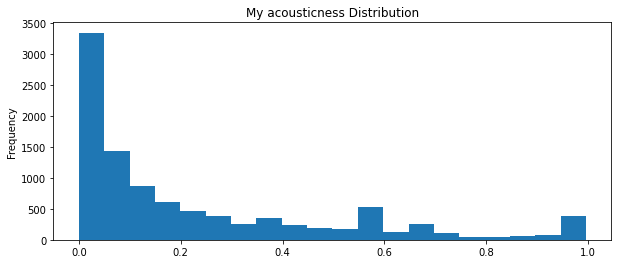

In [97]:
#hide_input
sample_10k.acousticness.plot(kind='hist', bins=20, figsize=(10, 4))
plt.title('My acousticness Distribution')
plt.show()

We can see there is little to no acousticness after 0.6 in my listening. This is very expected, with both hip hop and EDM containing none or little acoustic elements. 

## Danceability
> Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

Here, we take a look at danceability. Given my main genres, we should see higher danceability than normally, with EDM being a big part of my listening. And indeed we do see this. We have quite some peaks around 0.8, while the general distribution is closing in on 0 around 0.8. Since we only have an image, we cannot compare means, but I expect the general distribution mean to be somewhere between 0.5-0.6, while mine is 0.67

<img src="images/spotify_analysis/danceability.jpg" style="width:600px" >

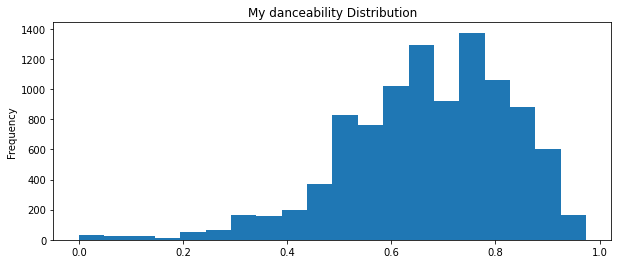

In [96]:
#hide_input
sample_10k.danceability.plot(kind='hist', bins=20, figsize=(10, 4))
plt.title('My danceability Distribution')
plt.show()

## Energy
> Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy.

Now, energy is a bit strange. In my year in review, Spotify always telling me I listen to so much energetic music. However, looking at this plot, I seem to be way lower than the general distribution. 

<img src="images/spotify_analysis/energy.jpg" style="width:600px" >

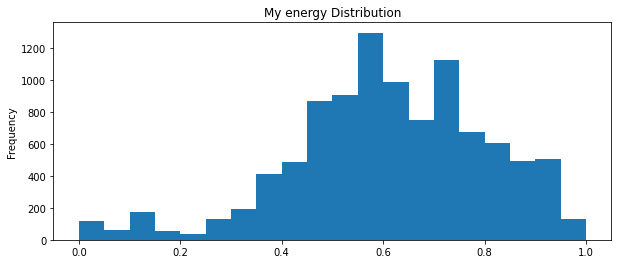

In [98]:
#hide_input
sample_10k.energy.plot(kind='hist', bins=20, figsize=(10, 4))
plt.title('My energy Distribution')
plt.show()

Let's see if we get some more clarity if we look at the energy per artist.

In [43]:
#hide_input
(
    comb.groupby('master_metadata_album_artist_name')
    .agg({'energy': ['count', 'mean']})
    .sort_values(('energy', 'count'), ascending=False)
    .head(20)
    .sort_values(('energy', 'mean'), ascending=False)
)

energy          
                                   count      mean
master_metadata_album_artist_name                 
6ix9ine                              260  0.699400
KIDS SEE GHOSTS                      302  0.691255
Fresku                               264  0.657288
Tchami                               370  0.644843
Netsky                               466  0.639095
Kid Cudi                             853  0.634662
Kendrick Lamar                      2740  0.633111
Mac Miller                           527  0.628738
Flume                                593  0.627781
Travis Scott                         265  0.623781
Yellow Claw                         2533  0.618704
Various Artists                     1594  0.618487
Eminem                              1567  0.616364
Yung Internet                        373  0.607120
G-Eazy                               926  0.605303
Lil Dicky                            303  0.588901
Kanye West                          1070  0.571160
Parov Stelar                         264  0.563025
Vitalic                              275  0.543753
Frank Sinatra                        804  0.512106

These results I find quite surprising. Yellow Claw, a Dutch house group whom I would consider to be generally pretty high energy is equal or below quite some hip hop artists, like Mac Miller and Kid Cudi. We can see the maximum energy in here is 6ix9ine, with a solid 0.69 😂. There is no denying that 6ix9ine is at that level of energy. However, KIDS SEE GHOSTS, the front for Kid Cudi and Kanye West, somehow also has 0.69, while I'd say that is much lower in energy. If we look at Reborn, the most popular song on the album, it's clearly a pretty slow song. 

> youtube: https://youtu.be/z2JpyynS3x8

Alternatively, we can look at the energy of my top songs. Here we get a clearer picture of the effect of different songs. 

In [44]:
#hide_input
(
    comb.groupby(['master_metadata_album_artist_name', 'master_metadata_track_name'])
    .agg({'energy': ['count', 'mean']})
    .sort_values(('energy', 'count'), ascending=False)
    .head(15)
    .sort_index(level=0, sort_remaining=False)
)

energy  \
                                                                                 count   
master_metadata_album_artist_name master_metadata_track_name                             
Kendrick Lamar                    HUMBLE.                                          125   
                                  DNA.                                             124   
                                  ELEMENT.                                          93   
                                  LOYALTY. FEAT. RIHANNA.                           81   
                                  YAH.                                              81   
                                  FEEL.                                             80   
Travis Scott                      goosebumps                                        99   
Yellow Claw                       City on Lockdown (feat. Juicy J & Lil Debbie)     96   
                                  Good Day (feat. DJ Snake & Elliphant)             87   
                                  Open (feat. Moksi & Jonna Fraser)                 87   
                                  Without You (feat. The Galaxy & Gia Koka)         82   
                                  Invitation (feat. Yade Lauren)                    80   
                                  Love & War (feat. Yade Lauren)                    78   
                                  Last Paradise (feat. Sody)                        78   
                                  Stacks (feat. Quavo, Tinie Tempah & Cesqeaux)     77   

                                                                                         
                                                                                   mean  
master_metadata_album_artist_name master_metadata_track_name                             
Kendrick Lamar                    HUMBLE.                                        0.6210  
                                  DNA.                                           0.5230  
                                  ELEMENT.                                       0.7050  
                                  LOYALTY. FEAT. RIHANNA.                        0.5350  
                                  YAH.                                           0.7000  
                                  FEEL.                                          0.7950  
Travis Scott                      goosebumps                                     0.7280  
Yellow Claw                       City on Lockdown (feat. Juicy J & Lil Debbie)  0.8410  
                                  Good Day (feat. DJ Snake & Elliphant)          0.5660  
                                  Open (feat. Moksi & Jonna Fraser)              0.5920  
                                  Without You (feat. The Galaxy & Gia Koka)      0.4880  
                                  Invitation (feat. Yade Lauren)                 0.6620  
                                  Love & War (feat. Yade Lauren)                 0.5330  
                                  Last Paradise (feat. Sody)                     0.5930  
                                  Stacks (feat. Quavo, Tinie Tempah & Cesqeaux)  0.0812

There are some pretty interesting facts here. First of, we can see see that my idea of Yellow Claw being very high energy is fairly debunked, at least with Spotify's definition of energy. Because some of these values are very strange, even more so when compared to some other artists and songs. Take for example the song _without you_ from Yellow Claw. This is a dubstep/brostep EDM song, with a pretty high tempo but has a value of 0.4880 for its energy level. This is lower than Frank Sinatra had on average in the previous table. In my opinion, something is wrong there. Furthermore, we can also see that their song _Stacks_ has an energy value of 0.0812, which, by all accounts, should be an anomaly. My expectation is that they trained a neural network with some hand labeled songs, and then applied that to all songs to estimate these values, and something went wrong in the case of this song. 

> youtube: https://youtu.be/Ek96g0oRTwc

## Instrumentalness
> Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.

So the instrumentalness 

<img src="images/spotify_analysis/instrumentalness.jpg" style="width:600px" >

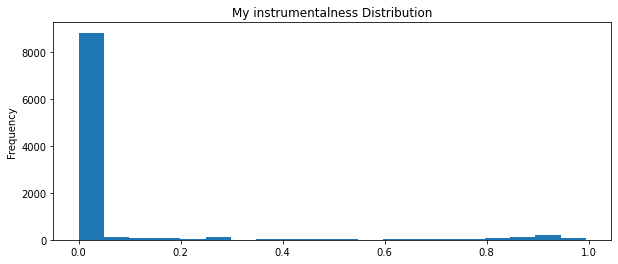

In [99]:
#hide_input
sample_10k.instrumentalness.plot(kind='hist', bins=20, figsize=(10, 4))
plt.title('My instrumentalness Distribution')
plt.show()

This is potentially interesting, since, naturally, hip-hop has a lot of vocals (so low instrumentalness), but genres like electro house and EDM generally don't have many. _However_, we can quickly see why by looking at the most influential artists for the largest genres. I'm showing the top 2 most played artists **per genre**, and they are categorized as the most general genre they have. 

In [46]:
#hide_input
(
    comb.groupby('top_1_genres').master_metadata_album_artist_name.value_counts()
    .groupby('top_1_genres')
    .nlargest(2)
    .reset_index(level=0, drop=True)
    .to_frame()
    .rename(columns={'master_metadata_album_artist_name': 'count'})
)

count
top_1_genres      master_metadata_album_artist_name       
bass trap         Brain                                 24
                  it's different                         7
brostep           Noisia                                20
                  Culprate                               7
conscious hip hop Rage Against The Machine               4
                  Lauryn Hill                            2
edm               Yellow Claw                         2531
                  Flume                                592
electro house     Vitalic                              274
                  Chris Lorenzo                         46
electronic trap   Champagne Drip                        52
                  Sam Gellaitry                          8
hip hop           Faith Evans                           76
                  Blackstreet                           35
house             FISHER                               247
                  Friend Within                         45
pop               Disclosure                            99
                  Camila Cabello                        45
pop rap           Jason Derulo                           8
                  OneRepublic                            6
rap               Kendrick Lamar                      2738
                  Eminem                              1564

As most influential EDM artists, we see Yellow Claw and Flume, both of which have a lot of vocals in their music. **This explains our instrumentalness plot!**. We can also see that the top genres quickly fall apart after rap and EDM, since songs that are tagged with genres like _pop rap_ and _hip hop_ are in many cases also tagged as _rap_. As a consequence, we get songs with a very small listening share in this overview, like Jason Derulo (8 plays) and One Republic (6 plays). Neither of which I'd generally consider to be my taste. 

However, if we redo this analysis, but we drop the most general genres, we get much more interesting results. To be specific, I've ignored the values _pop_, _edm_, _rap_, _pop rap_ and _hip hop_, unless there were no other genre labels. In that case, we still take that genre. The result is below, and quite interesting. The table shows the top 20 most played artists and the genre they fall in. 

In [47]:
#hide_input
(
    comb.groupby('top_1_genres_filtered').master_metadata_album_artist_name.value_counts()
    .nlargest(20)
    .to_frame()
    .sort_index(level=0, sort_remaining=False)
)

master_metadata_album_artist_name
top_1_genres_filtered master_metadata_album_artist_name                                   
chicago rap           Kanye West                                                      1065
christmas             Frank Sinatra                                                    804
conscious hip hop     Kendrick Lamar                                                  2738
detroit hip hop       Eminem                                                          1564
downtempo             Flume                                                            592
                      Parov Stelar                                                     263
dutch hip hop         Yung Internet                                                    373
                      Fresku                                                           263
electro house         Yellow Claw                                                     2531
                      Tchami                                                           370
                      Vitalic                                                          274
emo rap               6ix9ine                                                          260
house                 FISHER                                                           247
indie pop rap         G-Eazy                                                           926
liquid funk           Netsky                                                           466
rap                   Kid Cudi                                                         852
                      Mac Miller                                                       527
                      Lil Dicky                                                        303
                      KIDS SEE GHOSTS                                                  302
                      Travis Scott                                                     264

Without the super general genres, we can finally start to see some trends. Given the fact that _rap_ is still the main genre of 5 artists, this often seems to be one of few labels applied, possibly with the other labels I was removing. The results is that these artists do not belong to any specific subgenres within hip hop, which is fairly cool to see. Does this also mean they are per definition mainstream?

> Note: In [part 2](https://www.baukebrenninkmeijer.nl/posts/spotify-listening-history-analysis-part-2.html#altair-viz-df498a17d33e43a0a4a6c92cfd4a4902:~:text=Instead%20of%20Christmas%2C%20in%20December%20of,look%20at%20in%20another%20blog%20post.), the question arose of why _emo rap_ was one of my main genres in some months. This is also explained by this plot, because 6ix9ine is regarded as emo rap by spotify, and his presence in my listening is very varied, with sometimes none and sometimes quite a bit. 

## loudness
> The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db.



<img src="images/spotify_analysis/loudness.jpg" style="width:600px" >

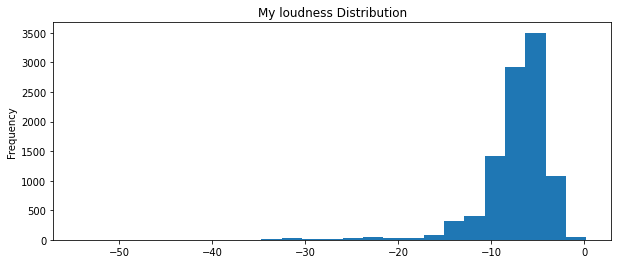

In [101]:
#hide_input
sample_10k.loudness.plot(kind='hist', bins=25, figsize=(10, 4))
plt.title('My loudness Distribution')
plt.show()

We can see my music is quite a bit louder than average, with almost all of the mass of the distribution being between -10 and 0, with a small tail between -15 and -10. In the general distribution, the tail extends quite a bit beyond -20, whereas there is virtually nothing beyond -18 in my distribution. Let's see who is responsible for all of this noise 😠. 

In [49]:
#hide_input
(
    comb.groupby('master_metadata_album_artist_name')
    .agg({'loudness': ['count', 'mean']})
    .sort_values(('loudness', 'count'), ascending=False)
    .head(20)
    .sort_values(('loudness', 'mean'), ascending=False)
)

loudness          
                                     count      mean
master_metadata_album_artist_name                   
6ix9ine                                260 -5.624454
Travis Scott                           265 -5.832879
Kid Cudi                               853 -6.496838
Kanye West                            1070 -6.535216
KIDS SEE GHOSTS                        302 -6.612129
Fresku                                 264 -6.614091
Netsky                                 466 -6.690002
G-Eazy                                 926 -6.849693
Yellow Claw                           2533 -6.875627
Kendrick Lamar                        2740 -7.033027
Eminem                                1567 -7.094228
Various Artists                       1594 -7.189992
Tchami                                 370 -7.304330
Flume                                  593 -7.348245
Mac Miller                             527 -7.576696
Parov Stelar                           264 -7.825705
Yung Internet                          373 -7.844906
Vitalic                                275 -8.272200
Frank Sinatra                          804 -8.528413
Lil Dicky                              303 -9.120274

This table is pretty clear. We see that none of my top 20 most played artists have an average loudness lower than -10, indicating quite high loudness on average. If we look at the top 5, we see that apparently hip hop artists are very loud, but also specifically Kid Cudi, Kanye West, and then those two combined in KIDS SEE GHOSTS. The reason for this I expect to be that they have sounds playing at almost at all times, rather than that they are extremely loud in their peaks.  

It also comes as no surprise that 6ix9ine is the loudest, since he's essentially screaming in most of his songs 😅. 

## valence
> A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

This is a very interesting feature. Let's see what information it gives us!

<img src="images/spotify_analysis/valence.jpg" style="width:600px" >

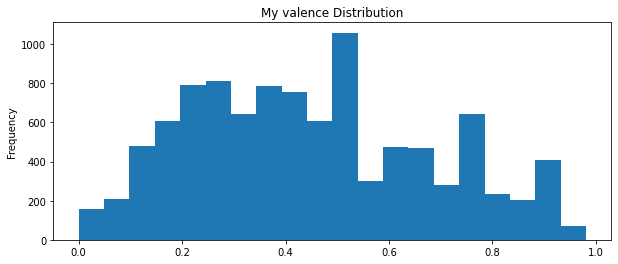

In [100]:
#hide_input
sample_10k.valence.plot(kind='hist', bins=20, figsize=(10, 4))
plt.title('My valence Distribution')
plt.show()

That's quite the difference! First off, we can see a clear decline towards 1.0 for my distribution, whereas in the general distribution, this is much rounder. Furthermore, we can see that my distribution a lot spikier, possibly indicating the effects of certain albums/songs that have been played a lot and have a very narrow spread with regards to valence. In general we can see my music taste leans more towards the low side of valence, indicating a preference for sad, depressed and angry music. In general, I think it will be angry, which is the sentiment in a lot of hip hop, but also techno, drum and bass and some parts of house. 

If we look at the most positive and most negative songs with more than 5 plays, we see some interesting results. 

In [51]:
#hide_input
d = (
    comb.groupby(['master_metadata_album_artist_name', 'master_metadata_track_name'])
    .agg({'valence': ['count', 'mean']})
    .sort_values(('valence', 'count'), ascending=False)
    .sort_index(level=0, sort_remaining=False)
)
d.loc[d[('valence', 'count')] > 5].sort_values(('valence', 'mean'))

valence         
                                                                count     mean
master_metadata_album_artist_name master_metadata_track_name                  
Lil Dicky                         White Crime                      19  0.00000
Eminem                            White America                    31  0.00000
Kanye West                        Fade                             37  0.00000
Ellen Allien                      Stormy Memories                  10  0.00001
Hollen                            Sleeping Dogs - Original         11  0.01400
...                                                               ...      ...
Ed Sheeran                        Shape of You                      9  0.93100
Fresku                            Chickie (skit)                   15  0.93800
Victor Ruiz                       Brujeria                          7  0.96000
Kendrick Lamar                    Momma                            36  0.96300
Yung Internet                     Helemaal Top (feat. Donnie)      48  0.96300

[1171 rows x 2 columns]

We can see that there are likely some errors in here, with _White Crime_ and _White America_ both having a score of 0.0. On the positive side of the scale (close to 1), we see Ed Sheeran which is not surprising. We also see Yung Internet with _Helemaal Top_, which is a song about feeling great. However, we also have Kendrick Lamar's _Momma_. Now, this is interesting cause it does not typically resonate as a very happy or cheerful song. We'll attribute this to the Spotify interpretation of this value. See for yourself:

> youtube: https://youtu.be/q1AOP6NtGuc

If we take a higher level view, we can look at the artists and identify more broader trends. 

In [52]:
#hide_input
(
    comb.groupby(['master_metadata_album_artist_name'])
    .agg({'valence': ['count', 'mean']})
    .sort_values(('valence', 'count'), ascending=False)
    .head(15)
    .sort_values(('valence', 'mean'))
)

valence          
                                    count      mean
master_metadata_album_artist_name                  
Kanye West                           1070  0.327687
Tchami                                370  0.360095
Netsky                                466  0.383689
KIDS SEE GHOSTS                       302  0.414606
Yellow Claw                          2533  0.430344
Frank Sinatra                         804  0.434713
Lil Dicky                             303  0.445153
G-Eazy                                926  0.445842
Mac Miller                            527  0.462410
Kendrick Lamar                       2740  0.469246
Various Artists                      1594  0.476991
Kid Cudi                              853  0.486193
Eminem                               1567  0.493737
Yung Internet                         373  0.511973
Flume                                 593  0.575045

Some interesting insights:
1. **Kanye is depressing**: Kanye West is very low in valence, meaning most of his songs are angry, depressed or sad. This makes sense, given his oeuvre, with songs like _[Waves](https://www.youtube.com/watch?v=ML8Yq1Rd6I0)_ (sad), _[Violent Crimes](https://www.youtube.com/watch?v=DSY7u8Jg9c0)_ (sad), _[Piss On Your Grave](https://www.youtube.com/watch?v=KCsex2tGXrs)_ (angry) and _[I Am A God](https://www.youtube.com/watch?v=KuQoQgL63Xo)_ (angry). 
2. **Bias of electronic music**: We have some electronic artists like Tchami and Netsky which also rank very low, but which are not specifically angry or sad music producers in my experience. Maybe electronic music has a bias here and is faster to be considered angry or sad?
3. **Non-polarity**: We see quite some artists hovering around 0.5, indicating either a healthy balance in valence between their songs or just a general non-polarity in their songs. I took a detailed look at Kanye West for the first point, and he has a fairly wide spread, with the weight more on the sad and angry side, hence his low average valence. I assume most artists will be similar, and have a wide spread between their songs.

# Audio features per Genre 🎸
Apart from the details per feature, we can also take a look at how these distributions are affected by genres. We will mostly stick to the larger genres, because there are infinite options to take a look at.

## Energy in Rap and EDM
Given our results in previous sections, one of the things I'd like to look deeper into is the effects of EDM and rap with regards to energy. 

In [104]:
#hide_input
alt.data_transformers.disable_max_rows()

column = 'top_1_genres'
genres = ['edm', 'rap']

selection = alt.selection_multi(fields=[column], bind='legend')

alt.Chart(comb[comb[column].isin(genres)].sample(4000, random_state=42)).transform_density(
    'energy',
    as_=['energy', 'density'],
    groupby=[column],
).mark_area(fillOpacity=0.2,).encode(
    x='energy',
    y='density:Q',
    color=alt.condition(selection, column, alt.value('lightgray')),
    stroke=alt.condition(selection, column, alt.value('lightgray')),
).add_selection(
        selection
).properties(
    title='KDE of Energy distribution for hip hop subgenres',
    width=MAXWIDTH,
)

alt.Chart(...)

Above, we see the [Kernel Density Estimation](https://en.wikipedia.org/wiki/Kernel_density_estimation) (KDE) of energy for rap and EDM. Rap is strange, since it seems to have two distinct peaks; one around 0.6 and one around 0.75. EDM has a more well defined single peak at 0.6. Furthermore, we see that EDM is more prevalent in the high energy values, which is not too unsurprising to see. Let's dive a bit deeper into the two peaks of rap. 

If we plot different hip hop subgenres, we can see how these peaks come to be. We plot the largest three hip hop subgenres. _Detroit hip hop_ seems to have more of a peak around 0.75, while _conscious hip hop_ and _chicago rap_ have peaks around at 0.6. It seems that they have a lot more energy in Detroit!

In [105]:
#hide_input
alt.data_transformers.disable_max_rows()

column = 'top_1_genres_filtered'
genres = ['conscious hip hop', 'detroit hip hop', 'chicago rap']

selection = alt.selection_multi(fields=[column], bind='legend')

alt.Chart(comb[comb[column].isin(genres)].sample(2000, random_state=142)).transform_density(
    'energy',
    as_=['energy', 'density'],
    groupby=[column],
).mark_area(fillOpacity=0.2,).encode(
    x='energy',
    y='density:Q',
    color=alt.condition(selection, column, alt.value('lightgray')),
    stroke=alt.condition(selection, column, alt.value('lightgray')),
).add_selection(
        selection
).properties(
    title='KDE of Energy distribution for hip hop subgenres',
    width=MAXWIDTH,
)

alt.Chart(...)

## Valence in Rap and EDM

In [106]:
#hide_input
alt.data_transformers.disable_max_rows()

column = 'top_1_genres'
genres = ['edm', 'rap']
audio_feature = 'valence'

selection = alt.selection_multi(fields=[column], bind='legend')

alt.Chart(comb[comb[column].isin(genres)].sample(2000, random_state=42)).transform_density(
    audio_feature,
    as_=[audio_feature, 'density'],
    groupby=[column],
).mark_area(fillOpacity=0.2,).encode(
    x=audio_feature,
    y='density:Q',
    color=alt.condition(selection, column, alt.value('lightgray')),
    stroke=alt.condition(selection, column, alt.value('lightgray')),
).add_selection(
        selection
).properties(
    title=f'KDE of {audio_feature} distribution for hip hop subgenres',
    width=MAXWIDTH,
)

alt.Chart(...)

We can see some interesting differences in valence for these genres. We observe that EDM is more prevalent in the low valence values (0.0-0.2), dropping to zero much later than rap. Rap, on the other hand, is more prevalent in the 0.3-0.5 range than EDM. Now, we still don't know if 0.5 valence means it is neutral, but it can at least tell us that rap is on average less sad and angry than EDM, which I find an interesting discovery, since I would have guessed it the other way around. 

# Audio features against each other ⚔️

To find interesting relationships between these audio features, we can create a pairplot, that create a scatterplot for each two variables. Because the calculation time for the number of data points times the number of plots is very high, we sample the dataset. This should allow us to visualize the distributions in general sense. We don't require each individual data point here. 

We sample 2000 data points at random. We also filter on the two largest genres, EDM and rap, so we can see some differences between these genres. Lastly, and this is quite important, we'll drop duplicates. Otherwise we would get many copies of the songs that are frequently played, but in these plots, we don't care about that. 

In [58]:
#hide
sample2 = comb.loc[comb.top_1_genres.isin(['edm', 'rap']), audio_columns + ['top_1_genres']].sample(2000, random_state=42).dropna()

In [59]:
#hide
# Plot sns pairplot with all audio columns. Color per genre. Sample is only EDM and Rap in it, to keep manageable. 
plot_sns_pairplot = False
if plot_sns_pairplot:
    g = sns.pairplot(sample2, hue='top_1_genres')
    g.fig.suptitle('Audio features against audio features, colored by genre', y=1.01)
    plt.show()

In [60]:
#hide
# Samples top_1_genres with all track that are in EDM or rap. Unsampled, so large data. 
sample = (comb.loc[comb['top_1_genres'].isin(['edm', 'rap']), ['master_metadata_track_name', 'master_metadata_album_artist_name', 'master_metadata_album_album_name', 'top_1_genres_filtered', 'top_1_genres'] + audio_columns]
          .drop_duplicates(subset=['master_metadata_track_name', 'master_metadata_album_artist_name'])
#           .sample(5000, random_state=42)
         )

In [ ]:
#hide
# This plots all columns with all datapoints, creating the LARGE plot. Save it and link to it. 
column = 'top_1_genres'
cols = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'loudness', 'valence']

selection = alt.selection_multi(fields=[column], bind='legend')

chart = alt.Chart(sample).mark_point(filled=False, opacity=0.4, size=10).encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color=alt.condition(selection, column, alt.value('lightgray')),
    tooltip=['master_metadata_track_name', 'master_metadata_album_artist_name', column]
).properties(
    width=100,
    height=100,
).repeat(
    row=audio_columns,
    column=audio_columns
).add_selection(
        selection
).properties(
    title='Pairplot of the interesting audio features',
)
chart

In [ ]:
#hide
# Save the chart from above plot so you can import it. 
chart.save('assets/chart.html')

In [72]:
#hide
sample = (comb.loc[comb['top_1_genres'].isin(['edm', 'rap']), ['master_metadata_track_name', 'master_metadata_album_artist_name', 'master_metadata_album_album_name', 'top_1_genres_filtered', 'top_1_genres'] + audio_columns]
          .drop_duplicates(subset=['master_metadata_track_name', 'master_metadata_album_artist_name'])
          .sample(1000, random_state=42)
         )
sample = sample[~(sample.master_metadata_track_name == 'White Crime')]

In [73]:
#hide_input
column = 'top_1_genres'
cols = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'loudness', 'valence']

selection = alt.selection_multi(fields=[column], bind='legend')

chart = alt.Chart(sample).mark_point(filled=False, opacity=0.4, size=10).encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color=alt.condition(selection, column, alt.value('lightgray')),
    tooltip=['master_metadata_track_name', 'master_metadata_album_artist_name', column]
).properties(
    width=100,
    height=100,
).repeat(
    row=cols,
    column=cols
).add_selection(
        selection
).properties(
    title='Pairplot of the interesting audio features',
)
chart

alt.RepeatChart(...)

Thats a pretty big plot with a _lot_ of information. Lets see if we can find some interesting insights. 

1. **Distribution differences between rap and EDM**: We see that in the outliers, there are generally many more EDM songs than rap songs. This might indicate that in EDM, there is more variation in these aspects. This phenomenon is visible in the instrumentalness plots, because in this category, almost all of the outliers are in EDM. But this is also the case for valence vs loudness, energy vs danceability, loudness vs danceability and some others. We see that several variables are returning, meaning that there's a distribution difference in those marginal distributions. 
2. **Outliers**: We can see two outliers in many plots, being _Sound of Walking Away_ from Illenium, and _White Iverson_ from Post Malone. This is because _Sound of Walking Away_ is just incredibly low on loudness. _White Iverson_ is more interesting, because it is still part of the general distribution in loudness, albeit on the edge. But the combination of its features is just often very unique, like in loudness vs instrumentalness, instrumentalness vs energy and instrumentalness vs danceability. If compared to just the rap tracks, it's also an outlier in danceability vs acousticness and acousticness vs loudness.
3. **Linear relationships**: We can also identify some roughly linear relationships. 
  - **Acousticness and Loudness**: As acousticness increases, loudness seems to decrease, especially near the high acousticness values. 
  - **Energy vs loudness**: As the energy of a song increases, so does it loudness often. This is not a huge surprise, given the songs that are used for dancing. 
  - **Energy vs Acousticness**: Unsurprisingly, given the two former points, there is also a relationship visible between energy and acousticness, where the energy decreases with the increase of acousticness. 

I've also created the large version of above plot, with more columns and more datapoints. See it here [big plot]({{ site.baseurl }}/assets/chart.html)

# In conclusion
In part 3 we have taken a closer look at the audio features that are in Spotify data, specifically for my listening. We've seen what the effects of EDM and rap are on certain audio features, and for rap how it's built up From its subgenres. Lastly, we've also seen how most of the audio features relate to other features, and what songs are outliers in those distributions. 

With regards to my initial goal: to track what I'm doing (and also learn about myself), this part was a bit harder. The audio features are not always intuitive to interpret and can differ from what your expectations are. They are also a lot less applicable in daily life, whereas favorite artists is still quite relatable. Nevertheless, it was quite interesting to see what the effects of genres and subgenres was on the global distributions. 


If you liked this blogpost, don't hesitate to reach out to me on [linkedin](https://www.linkedin.com/in/bauke-brenninkmeijer-40143310b) or [twitter](https://twitter.com/Bauke_B). 😊

<p align="center">
	<a href="https://github.com/Baukebrenninkmeijer"><img src="https://img.shields.io/github/followers/Baukebrenninkmeijer.svg?label=GitHub&style=social" alt="GitHub" style="display:inline-block;"></a>
	<a href="https://www.linkedin.com/in/bauke-brenninkmeijer-40143310b"><img src="https://img.shields.io/badge/LinkedIn--_.svg?style=social&logo=linkedin" alt="LinkedIn" style="display:inline-block;"></a>
</p>